In [1]:
# Task: Improve the speed and accuracy of detecting and localising Brain tumor based on MRI scans
# Which will drastically remove the cost of cancer diagnosis and help in early diagnoses of brain tumors
# develop a model to detect and localise Brain tumor
# You have been provided with 3900 brain MRI scans along with their brain tumor location

# Processes: Using  AI to improve diseases detection and location process
# Build and train a segmentation Res-U-Net model to localise brain tumor in images

# Talk about AI in health care 
# Deep learning
# for the training data, I have two images; the brain MRI (to show if it has cancer or not) and a mask associated with the image.


# First stage we are going to train a ResNet deeplearning classifier (Residual Neural Network) model
# Second stage, if a tumor has been detected after classification, then we need to localize the tumor using ResUNet Segmentation Model; it tells the location of the tumor
# Function of the image segmentation is to understand and extract information from images at the pixel-level


 

In [2]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing important libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
import tensorflow as tf 
from skimage import io
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as k
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random

%matplotlib inline

from warnings import filterwarnings
filterwarnings('ignore')


C:\Users\olayi\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [4]:
# Define the path to the downloads directory
downloads_path = os.path.join(os.path.expanduser('~'), 'Downloads')

# Check if the directory exists
if os.path.exists(r"C:\Users\olayi\Downloads\Projects\Health AI\Brain_Tumor\Healthcare+AI+Datasets\Healthcare AI Datasets\Brain_MRI"):
    print("Downloads directory found at:", downloads_path)
else:
    print("Downloads directory not found!")

# Change directory to the downloads folder
os.chdir(r"C:\Users\olayi\Downloads\Projects\Health AI\Brain_Tumor\Healthcare+AI+Datasets\Healthcare AI Datasets\Brain_MRI")



Downloads directory found at: C:\Users\olayi\Downloads


In [5]:
# Loading the dataset that contain Brain MRI and their corresponding mask
# loaded the mask path
# mask can be represented by associating pixel values with their coordinates 
brain_df = pd.read_csv(r"C:\Users\olayi\Downloads\Projects\Health AI\Brain_Tumor\Healthcare+AI+Datasets\Healthcare AI Datasets\Brain_MRI\data_mask.csv")


In [6]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [7]:
brain_df.head()

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [8]:
# Percentage of healthy sampples( without tumor)
# which means we have unbalanced dataset
len(brain_df[brain_df['mask'] == 0])/len(brain_df)

0.6505472130313057

In [9]:
# counts of healthy samples and unhealthy samples
brain_df['mask'].value_counts()

0    2556
1    1373
Name: mask, dtype: int64

### Performing Data Exploration

In [10]:
# To know the number of categories we have in the mask
brain_df['mask'].value_counts().index

Int64Index([0, 1], dtype='int64')

In [11]:
# using plotly to show the categories
# plotly shows interactive bar chart
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)', marker_line_width = 3, opacity = 0.5)
fig.update_layout(title='Distribution of Categories',
                  xaxis_title='Categories',
                  yaxis_title='Count')

fig.show()


In [12]:
# mask path
brain_df['mask_path']


0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [13]:
# Image path
brain_df['image_path']

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: image_path, Length: 3929, dtype: object

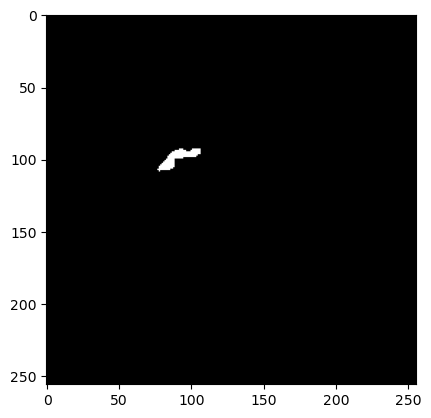

In [14]:
# using openCV to read the image and plt to show the image
plt.imshow(cv2.imread(brain_df.mask_path[623]))

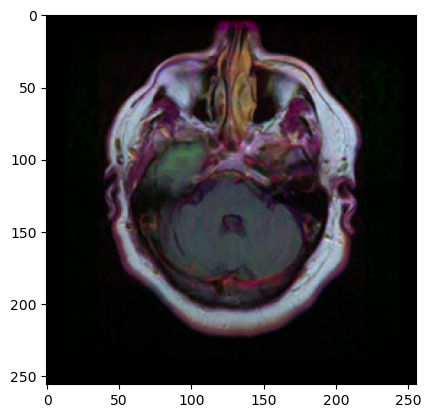

In [15]:
plt.imshow(cv2.imread(brain_df.image_path[623]))


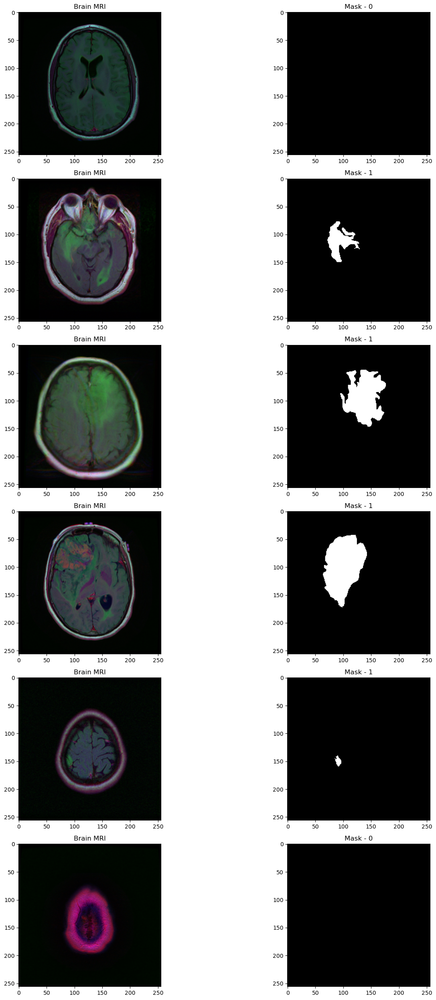

In [16]:
# visualizing the images(MRI and mask) in the dataset

fig, axis = plt.subplots(6, 2, figsize = (16,25))
count = 0
for i in range(6):
    i = random.randint(0, len(brain_df)) # Select a random index 
    axis[count][0].title.set_text('Brain MRI') # Set title
    axis[count][0].imshow(cv2.imread(brain_df.image_path[i])) # MRI
    axis[count][1].title.set_text('Mask - ' + str(brain_df['mask'][i])) # Plot title on the mask (0 or 1)
    axis[count][1].imshow(cv2.imread(brain_df.mask_path[i]))
    count += 1
    
fig.tight_layout()


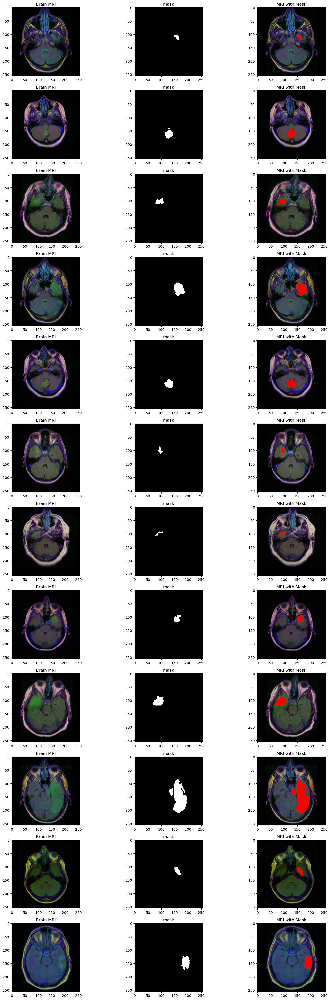

In [17]:
# visualizing the 12 randomly selected MRI and it correspong Mask from only unhealthy patients
# showing the MRI and the ,mask on top of each other (showing the mask in red color)

fig, axis = plt.subplots(12, 3, figsize = (16,40))
count = 0
for i in range(len(brain_df)):
    if brain_df['mask'][i] == 1 and count <12:
        img = io.imread(brain_df.image_path[i])
        axis[count][0].title.set_text('Brain MRI')
        axis[count][0].imshow(img)
                         
        mask = io.imread(brain_df.mask_path[i])
        axis[count][1].title.set_text('mask')
        axis[count][1].imshow(mask, cmap = 'gray')
        
        img[mask == 255] = (255,0,0)
        axis[count][2].title.set_text('MRI with Mask')
        axis[count][2].imshow(img)  
        count += 1
    
fig.tight_layout()

### Training a Classifier Model to Detect if Tumor Exits or Not

In [18]:
# Drop columns not needed for the training
brain_df_train = brain_df.drop(['patient_id'], axis =1)
brain_df_train.shape

(3929, 3)

In [19]:
# Convert the mask column to a categorical format.
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x : str(x))

In [20]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [21]:
# Split the data into train and test data
from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

In [22]:
# Create a image generator to generate images in batch format and do some processing on the data
from keras.preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes validation split of 0.15
datagen = ImageDataGenerator(rescale = 1./255., validation_split = 0.15)

In [23]:
train_generator = datagen.flow_from_dataframe(
dataframe = train,
directory = './',
x_col = 'image_path',
y_col = 'mask',
subset='training',
batch_size = 16,
shuffle = True,
class_mode ='categorical',
target_size = (256, 256))

val_generator = datagen.flow_from_dataframe(
dataframe = train,
directory = './',
x_col = 'image_path',
y_col = 'mask',
subset='validation',
batch_size = 16,
shuffle = True,
class_mode ='categorical',
target_size = (256, 256))

# Create a data generator for the test images
test_datagen = ImageDataGenerator(rescale = 1./255.)

test_generator = datagen.flow_from_dataframe(
dataframe = test,
directory = './',
x_col = 'image_path',
y_col = 'mask',
batch_size = 16,
shuffle = False,
class_mode ='categorical',
target_size = (256, 256))

Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [24]:
# Using an already pre-trained model (Transfer learning)
# creating the ResNet50 base model

basemodel = ResNet50(weights ='imagenet', include_top = False, input_tensor= Input(shape=(256, 256, 3)))

In [25]:
basemodel.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [26]:
# freeze the model
for layer in basemodel.layers:
    layers.trainable = False

In [27]:
# add a classification head to the model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size= (4,4))(headmodel)
headmodel = Flatten(name = 'flatten')(headmodel)
headmodel = Dense(256, activation= 'relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(256, activation= 'relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation= 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)


In [28]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [29]:
# compile the model
model.compile(loss= 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [30]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 20)

# save the best model with the least validation loss
checkpointer = ModelCheckpoint(filepath='classifier-resnet-weights.hdf5', verbose = 1, save_best_only = True)

In [31]:
history = model.fit(train_generator, steps_per_epoch=train_generator.n // 16, epochs = 10, validation_data= val_generator, validation_steps= val_generator.n // 16, callbacks= [checkpointer, earlystopping])

Epoch 1/10


177/177 [==============================] - ETA: 0s - loss: 0.9508 - accuracy: 0.6532
Epoch 1: val_loss improved from inf to 0.65904, saving model to classifier-resnet-weights.hdf5
177/177 [==============================] - 755s 4s/step - loss: 0.9508 - accuracy: 0.6532 - val_loss: 0.6590 - val_accuracy: 0.6331
Epoch 2/10
177/177 [==============================] - ETA: 0s - loss: 0.5868 - accuracy: 0.7535
Epoch 2: val_loss did not improve from 0.65904
177/177 [==============================] - 693s 4s/step - loss: 0.5868 - accuracy: 0.7535 - val_loss: 0.6681 - val_accuracy: 0.6331
Epoch 3/10
177/177 [==============================] - ETA: 0s - loss: 0.4516 - accuracy: 0.7977
Epoch 3: val_loss did not improve from 0.65904
177/177 [==============================] - 663s 4s/step - loss: 0.4516 - accuracy: 0.7977 - val_loss: 0.6843 - val_accuracy: 0.6351
Epoch 4/10
177/177 [==============================] - ETA: 0s - loss: 0.3710 - accuracy: 0.8353
Epoch 4: val_loss did not imp

In [32]:
# save model architecture to json file for future use
model_json = model.to_json()
with open('classifier_resnet_model.json', 'w') as json_file:
    json_file.write(model_json)


### Assess Trained Model Performance

In [33]:
# load json_file

with open('classifier_resnet_model.json', 'r') as json_file:
    json_savedModel = json_file.read()

model = tf.keras.models.model_from_json(json_savedModel)
model.load_weights('classifier-resnet-weights.hdf5')
model.compile(loss = 'categorical_crossentropy', optimizer= 'adam', metrics = ['accuracy'])

In [34]:
# make prediction
test_pred = model.predict(test_generator, steps = test_generator.n // 16, verbose = 1)

36/36 [==============================] - 38s 956ms/step


In [35]:
test_pred.shape

(576, 2)

In [36]:
test_pred

array([[9.9453026e-01, 5.4697674e-03],
       [9.7976160e-01, 2.0238433e-02],
       [4.4421285e-01, 5.5578715e-01],
       ...,
       [9.9669302e-01, 3.3069481e-03],
       [9.2080944e-12, 1.0000000e+00],
       [9.5426548e-01, 4.5734555e-02]], dtype=float32)

In [37]:
# obtain the predicted class from the model prediction
predict = []
for i in test_pred:
    predict.append(str(np.argmax(i)))
    
predict = np.asarray(predict)

In [38]:
predict

array(['0', '0', '1', '1', '1', '0', '0', '1', '1', '0', '0', '0', '0',
       '0', '0', '1', '1', '1', '0', '1', '1', '1', '0', '0', '0', '1',
       '0', '1', '0', '1', '1', '0', '0', '0', '1', '0', '0', '0', '0',
       '0', '0', '1', '1', '1', '0', '1', '1', '0', '1', '0', '1', '0',
       '1', '0', '0', '0', '1', '1', '0', '1', '0', '0', '0', '0', '1',
       '0', '1', '0', '0', '1', '1', '0', '0', '1', '0', '1', '0', '1',
       '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '1',
       '0', '0', '0', '0', '0', '0', '1', '0', '0', '1', '1', '0', '0',
       '0', '1', '0', '1', '0', '0', '0', '0', '1', '0', '1', '1', '1',
       '1', '1', '1', '0', '0', '0', '0', '1', '1', '0', '1', '1', '1',
       '0', '0', '1', '1', '1', '0', '0', '0', '1', '1', '1', '1', '0',
       '0', '0', '0', '1', '0', '1', '0', '0', '0', '1', '1', '1', '0',
       '1', '0', '0', '0', '1', '1', '0', '0', '1', '1', '0', '0', '0',
       '0', '0', '1', '1', '1', '0', '0', '1', '0', '1', '0', '0

In [39]:
# compare the predictions to the original test data
# since we have used test generator, it limited the images to len(predict), due to batch size
original_test = np.asarray(test['mask'])[:len(predict)]
len(original_test)

576

In [40]:
# obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original_test, predict)
accuracy

0.8697916666666666

<Axes: >

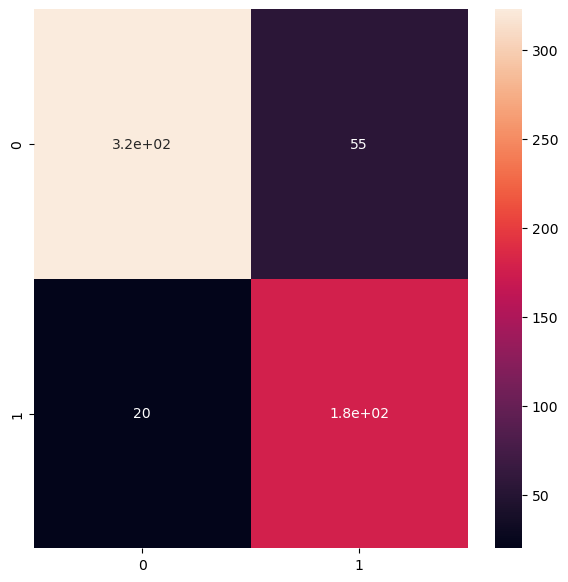

In [41]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original_test, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot = True)

In [42]:
# Obatin the classification report
from sklearn.metrics import classification_report

report = classification_report(original_test, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.94      0.85      0.90       378
           1       0.76      0.90      0.83       198

   micro avg       0.87      0.87      0.87       576
   macro avg       0.85      0.88      0.86       576
weighted avg       0.88      0.87      0.87       576



### Build A segmentation Model to Locate the Tumor

In [43]:
# Get the dataframe containing MRIs which have masks associated with them
brain_df_mask = brain_df[brain_df['mask']==1]
brain_df_mask.shape

(1373, 4)

In [44]:
# split the data into train the test set
from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(brain_df_mask, test_size = 0.15)
X_test, X_val = train_test_split(X_val, test_size = 0.5)

print('X_train ', X_train)
print('X_val ', X_val)
print('X_test ', X_test)

X_train                   patient_id  \
2744  TCGA_HT_7855_19951020   
3358  TCGA_HT_A5RC_19990831   
1773  TCGA_DU_A5TT_19980318   
3016  TCGA_HT_7879_19981009   
2691  TCGA_HT_7856_19950831   
...                     ...   
1684  TCGA_DU_8165_19970205   
2746  TCGA_HT_7855_19951020   
2986  TCGA_HT_7882_19970125   
3480  TCGA_DU_8164_19970111   
3532  TCGA_DU_8168_19970503   

                                             image_path  \
2744  TCGA_FG_6690_20020226/TCGA_FG_6690_20020226_27...   
3358  TCGA_DU_6401_19831001/TCGA_DU_6401_19831001_37...   
1773  TCGA_CS_6665_20010817/TCGA_CS_6665_20010817_17...   
3016  TCGA_FG_6690_20020226/TCGA_FG_6690_20020226_31...   
2691  TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_26...   
...                                                 ...   
1684  TCGA_DU_7008_19830723/TCGA_DU_7008_19830723_16...   
2746  TCGA_FG_7643_20021104/TCGA_FG_7643_20021104_27...   
2986  TCGA_DU_6399_19830416/TCGA_DU_6399_19830416_31...   
3480  TCGA_DU_6405_19851005/

In [45]:
# Create a seperate list for the imageId, classId to pass into the generator

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask = list(X_val.mask_path)

In [46]:
# utilities file contains the code for custom loass function and custom data generator
from utilities import DataGenerator

training_gen = DataGenerator(train_ids, train_mask)
validation_gen = DataGenerator(val_ids, val_mask)

In [47]:
# building ResUNet model
# Using the res block

def resblock(X, f):
    
    # make a copy of the input
    X_copy = X
    
    # main path 
    X = Conv2D(f, kernel_size = (1,1), strides = (1,1), kernel_initializer= 'he_normal')(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    
    X = Conv2D(f, kernel_size = (3,3), strides = (1,1), padding = 'same', kernel_initializer= 'he_normal')(X)
    X = BatchNormalization()(X)
    
    # Short path
    X_copy = Conv2D(f, kernel_size = (1,1), strides = (1,1), kernel_initializer= 'he_normal')(X_copy)
    X_copy = BatchNormalization()(X_copy)
    
    
    # Adding the output from the main path and the short path together
    X = add([X,X_copy])
    X = Activation('relu')(X)
    
    return X

In [48]:
# function to upscale and concetenate the values passed
def upsample_concat(x, skip):
    x = UpSampling2D((2,2))(x)
    merge = Concatenate()([x, skip])
    
    return merge

In [49]:
# build the network
input_shape = (256, 256, 3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3, activation ='relu', padding  = 'same', kernel_initializer = 'he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3, activation ='relu', padding  = 'same', kernel_initializer = 'he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 =  MaxPool2D(pool_size= (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1,32)
pool_2 = MaxPool2D(pool_size= (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2,64)
pool_3 = MaxPool2D(pool_size= (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3,128)
pool_4 = MaxPool2D(pool_size= (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4,256)

# Upsale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upsale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upsale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upsale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)


# Final Output
output = Conv2D(1, (1,1), padding = 'same', activation = 'sigmoid')(up_4)

model_seg = Model(inputs = X_input, outputs = output)

In [50]:
model_seg.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 16)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['batch_normalization[0]

### Train A Segmentation ResUNet Model To Localize Tumor

In [51]:
# using the custom loss function Focal_tversky, tversky_loss, tversky
from utilities import focal_tversky, tversky_loss, tversky

In [52]:
# code for focal_tversky
from keras.losses import binary_crossentropy
import keras.backend as K
import tensorflow as tf 

  

epsilon = 1e-5
smooth = 1

def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

def confusion(y_true, y_pred):
    smooth=1
    y_pred_pos = K.clip(y_pred, 0, 1)
    y_pred_neg = 1 - y_pred_pos
    y_pos = K.clip(y_true, 0, 1)
    y_neg = 1 - y_pos
    tp = K.sum(y_pos * y_pred_pos)
    fp = K.sum(y_neg * y_pred_pos)
    fn = K.sum(y_pos * y_pred_neg) 
    prec = (tp + smooth)/(tp+fp+smooth)
    recall = (tp+smooth)/(tp+fn+smooth)
    return prec, recall

def tp(y_true, y_pred):
    smooth = 1
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_pos = K.round(K.clip(y_true, 0, 1))
    tp = (K.sum(y_pos * y_pred_pos) + smooth)/ (K.sum(y_pos) + smooth) 
    return tp 

def tn(y_true, y_pred):
    smooth = 1
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_pred_neg = 1 - y_pred_pos
    y_pos = K.round(K.clip(y_true, 0, 1))
    y_neg = 1 - y_pos 
    tn = (K.sum(y_neg * y_pred_neg) + smooth) / (K.sum(y_neg) + smooth )
    return tn 

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    y_pred = tf.cast(y_pred, tf.float32)
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [53]:
# compile model

adam = tf.keras.optimizers.legacy.Adam(lr = 0.05, epsilon = 0.1)
model_seg.compile(optimizer= adam, loss = focal_tversky, metrics = [tversky])

In [54]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 20)

# save the best model with the least validation loss
checkpointer = ModelCheckpoint(filepath='ResUNet-weights.hdf5', verbose = 1, save_best_only = True)

In [55]:
history = model_seg.fit(training_gen, epochs = 40, validation_data= validation_gen, callbacks= [checkpointer, earlystopping])

Epoch 1/40
72/72 [==============================] - ETA: 0s - loss: 0.8447 - tversky: 0.2007
Epoch 1: val_loss improved from inf to 0.75451, saving model to ResUNet-weights.hdf5
72/72 [==============================] - 102s 1s/step - loss: 0.8447 - tversky: 0.2007 - val_loss: 0.7545 - val_tversky: 0.3127
Epoch 2/40
72/72 [==============================] - ETA: 0s - loss: 0.5082 - tversky: 0.5898
Epoch 2: val_loss improved from 0.75451 to 0.47842, saving model to ResUNet-weights.hdf5
72/72 [==============================] - 96s 1s/step - loss: 0.5082 - tversky: 0.5898 - val_loss: 0.4784 - val_tversky: 0.6244
Epoch 3/40
72/72 [==============================] - ETA: 0s - loss: 0.3789 - tversky: 0.7236
Epoch 3: val_loss did not improve from 0.47842
72/72 [==============================] - 106s 1s/step - loss: 0.3789 - tversky: 0.7236 - val_loss: 0.5118 - val_tversky: 0.5892
Epoch 4/40
72/72 [==============================] - ETA: 0s - loss: 0.3349 - tversky: 0.7658
Epoch 4: val_loss did no

In [56]:
# save model architecture to json file for future use
model_json = model_seg.to_json()
with open('ResUNet_model.json', 'w') as json_file:
    json_file.write(model_json)


### Assess Trained Segmentation ResUNet


In [58]:
from utilities import focal_tversky, tversky_loss, tversky

with open('ResUNet_model.json', 'r') as json_file:
    json_savedModel= json_file.read()

# load the model architecture 
model_seg = tf.keras.models.model_from_json(json_savedModel)
model_seg.load_weights('ResUNet-weights.hdf5')
adam = tf.keras.optimizers.Adam(lr = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [62]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import prediction

# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 [==============================] - 0s 198ms/step


In [63]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_DU_5872_19950223/TCGA_DU_5872_19950223_67...,No mask,0
1,TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_3.tif,No mask,0
2,TCGA_DU_A5TW_19980228/TCGA_DU_A5TW_19980228_29...,"[[[[6.579732e-06], [5.0200333e-07], [1.8209814...",1
3,TCGA_FG_7637_20000922/TCGA_FG_7637_20000922_17...,"[[[[1.3748944e-06], [5.6489725e-08], [3.797600...",1
4,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_25...,"[[[[4.1414055e-06], [1.4924562e-06], [7.196988...",1
...,...,...,...
585,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_23...,"[[[[3.941212e-06], [1.2909313e-06], [7.090385e...",1
586,TCGA_DU_5872_19950223/TCGA_DU_5872_19950223_69...,No mask,0
587,TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_24...,No mask,0
588,TCGA_DU_8165_19970205/TCGA_DU_8165_19970205_7.tif,No mask,0


In [64]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_DU_5872_19950223/TCGA_DU_5872_19950223_67...,TCGA_DU_5872_19950223/TCGA_DU_5872_19950223_67...,0,No mask,0
1,TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_3.tif,TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_3_...,0,No mask,0
2,TCGA_DU_A5TW_19980228/TCGA_DU_A5TW_19980228_29...,TCGA_DU_A5TW_19980228/TCGA_DU_A5TW_19980228_29...,0,"[[[[6.579732e-06], [5.0200333e-07], [1.8209814...",1
3,TCGA_FG_7637_20000922/TCGA_FG_7637_20000922_17...,TCGA_FG_7637_20000922/TCGA_FG_7637_20000922_17...,1,"[[[[1.3748944e-06], [5.6489725e-08], [3.797600...",1
4,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_25...,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_25...,0,"[[[[4.1414055e-06], [1.4924562e-06], [7.196988...",1


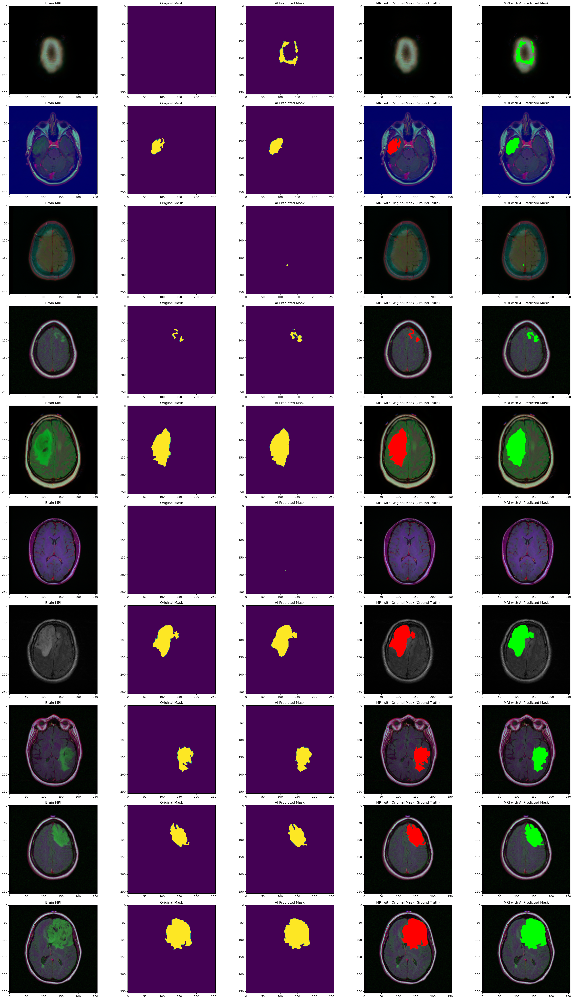

In [65]:
count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image 
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image 
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()